In [1]:
import matplotlib.pyplot as plt
import cv2
from skimage import io,  img_as_float,img_as_ubyte,img_as_bool, color, measure
from skimage.filters import try_all_threshold , median, threshold_otsu, threshold_yen,threshold_isodata,threshold_mean,threshold_li,threshold_minimum,threshold_triangle
from skimage.morphology import disk,erosion,dilation,square
import numpy as np
from tqdm import tqdm
from scipy import ndimage

<h3>Let's define the path where the images are located:</h3>

In [2]:
#Path of images
root="/home/jair/Downloads/merge_1/"

<h3>Let's check the image dimensions per channel.</h3>

In [3]:
C0 = io.imread(root+'C0.tif')
C1 = io.imread(root+'C1.tif')
C2 = io.imread(root+'C2.tif')
if len(C0.shape) <=2:
    C0=img_as_float(np.expand_dims(C0, axis=0))
    C1=img_as_float(np.expand_dims(C1, axis=0))
    C2=img_as_float(np.expand_dims(C2, axis=0))
else:
    C0=img_as_float(C0)
    C1=img_as_float(C1)
    C2=img_as_float(C2)
    
nstack=C0.shape[0]
xs=C1.shape[1]
ys=C2.shape[2]

print("dimensiones C0: ",C0.shape)
print("dimensiones C1: ",C1.shape)
print("dimensiones C2: ",C2.shape)

dimensiones C0:  (16, 2048, 2560)
dimensiones C1:  (16, 2048, 2560)
dimensiones C2:  (16, 2048, 2560)


In [4]:
print("Numero de pixeles en x: ",xs)
print("Numero de pixeles en y: ",ys)
print("Tenemos imagenes con un stack de: ",nstack)

Numero de pixeles en x:  2048
Numero de pixeles en y:  2560
Tenemos imagenes con un stack de:  16


<h3>-Green signal (neurons) + blue (nuclei) + red (c-fos) = neurons expressing c-fos</h3>

<h3>-Blue signal (nuclei) + red (c-fos) = likely another type of cell expressing c-fos but not neurons. </h3>

<h3>Let's define functions to view images and masks.</h3>

In [5]:
def dibuja_imagenes(Cn,t,c):
    
    if c == 0:
        color='Greens'
    if c == 1:
        color='Blues'
    if c== 2:
        color='Reds'
    fig, axs = plt.subplots(4,4, figsize=(20, 20))

    for i in range(t):
        fila_actual = i // 4
        columna_actual = i % 4
        img = Cn[i,:,:]
        axs[fila_actual, columna_actual].imshow(img,cmap=color)
        axs[fila_actual, columna_actual].axis('off')  

    
    plt.subplots_adjust(wspace=0.2, hspace=0.2)


    plt.show()

In [6]:
def dibuja_mascaras(Cn,t):

    fig, axs = plt.subplots(4,4, figsize=(20, 20))

    for i in range(t):
        fila_actual = i // 4
        columna_actual = i % 4
        img = Cn[i,:,:]
        axs[fila_actual, columna_actual].imshow(img)
        axs[fila_actual, columna_actual].axis('off')  # Desactivar los ejes

    
    plt.subplots_adjust(wspace=0.2, hspace=0.2)


    plt.show()

<h3>Visualizing C0 (Green Channel)</h3>

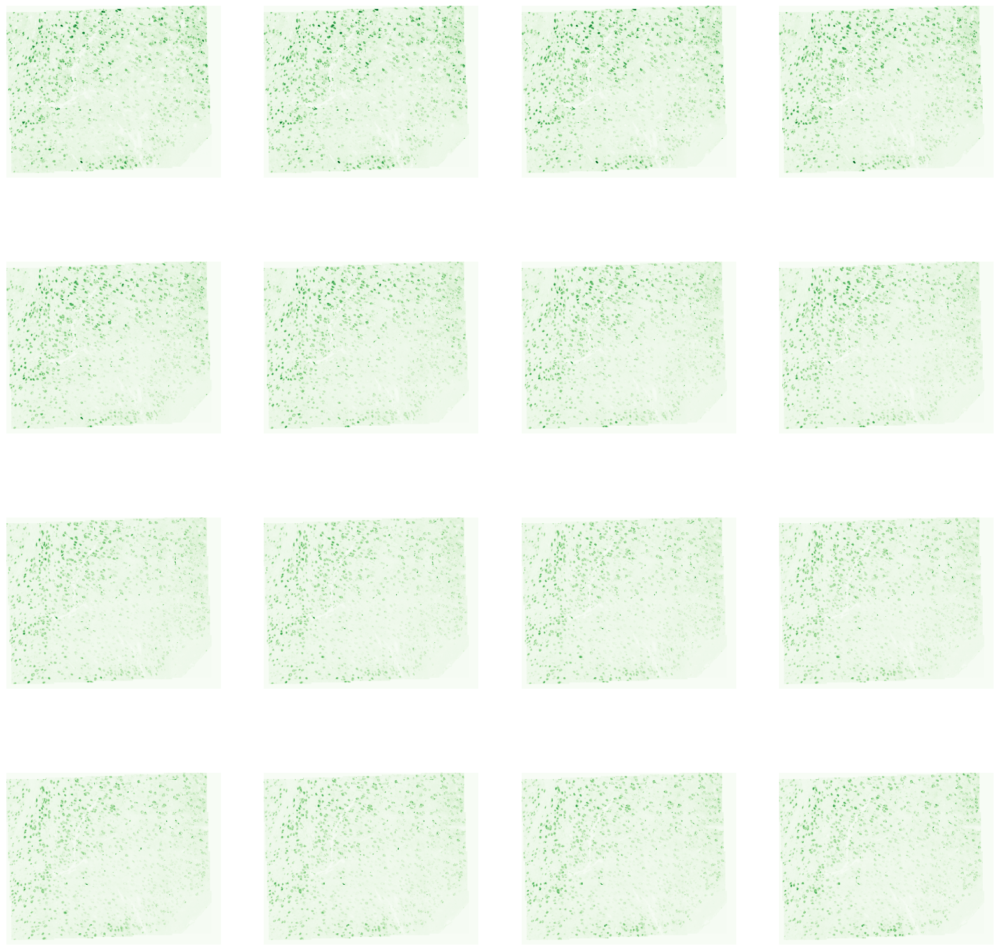

In [7]:
dibuja_imagenes(C0,nstack,0)

<h3>Visualizing C1 (Blue Channel)</h3>

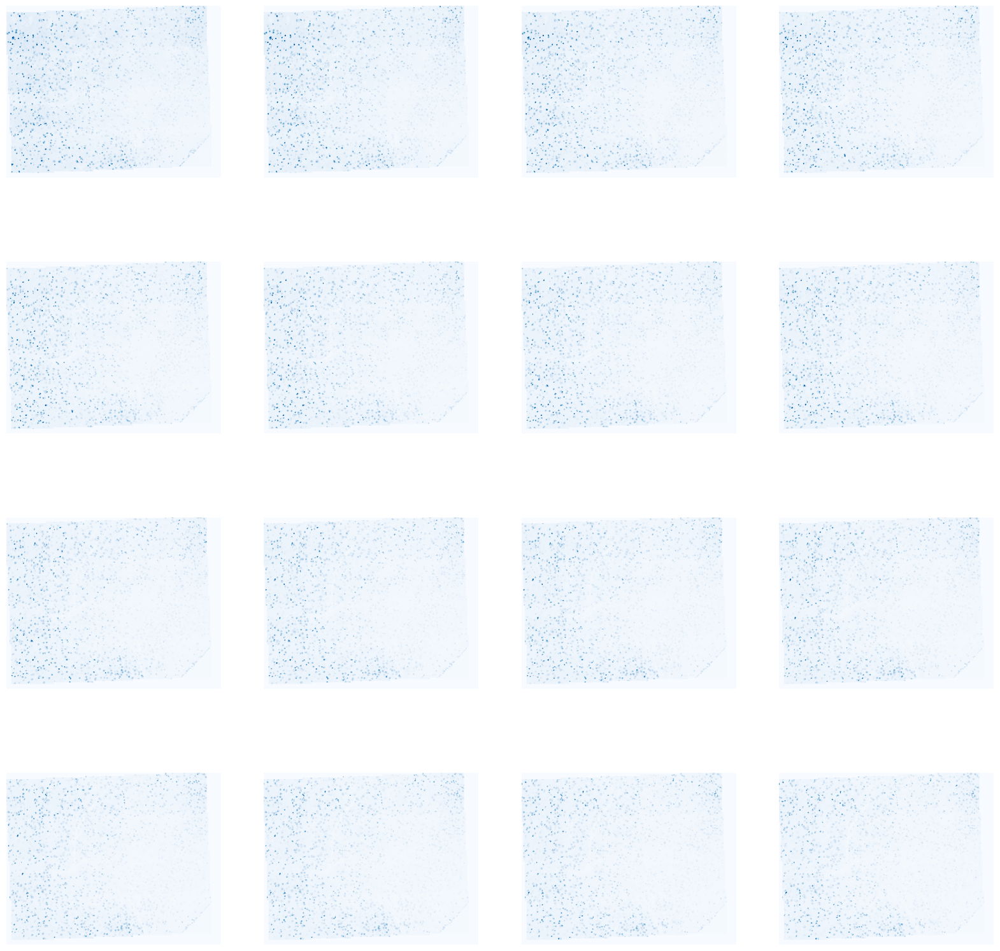

In [8]:
dibuja_imagenes(C1,nstack,1)

<h3>Visualizing C2 (Red Channel)</h3>

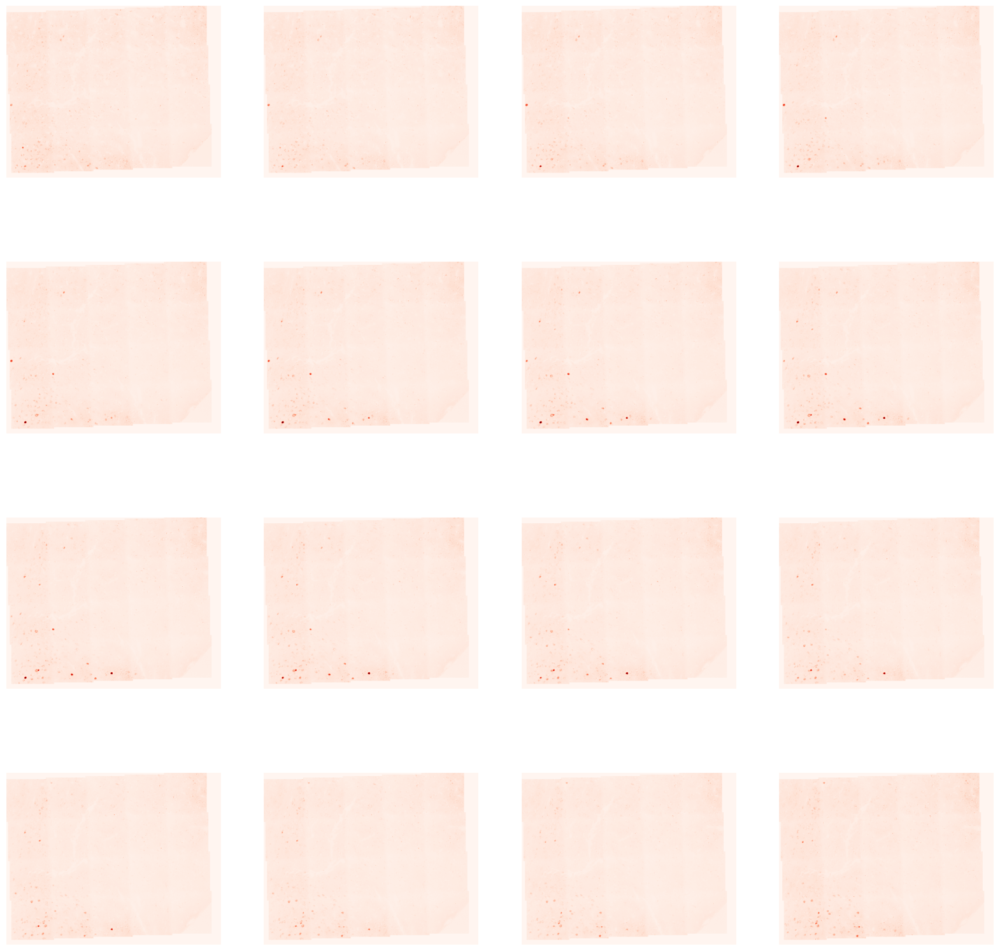

In [9]:
dibuja_imagenes(C2,nstack,2)

<h3>Let's visualize different thresholds to generate masks for the first image of each channel to see which one fits best.</h3>

<h3>Visualizing masks for the green channel without smoothing</h3>

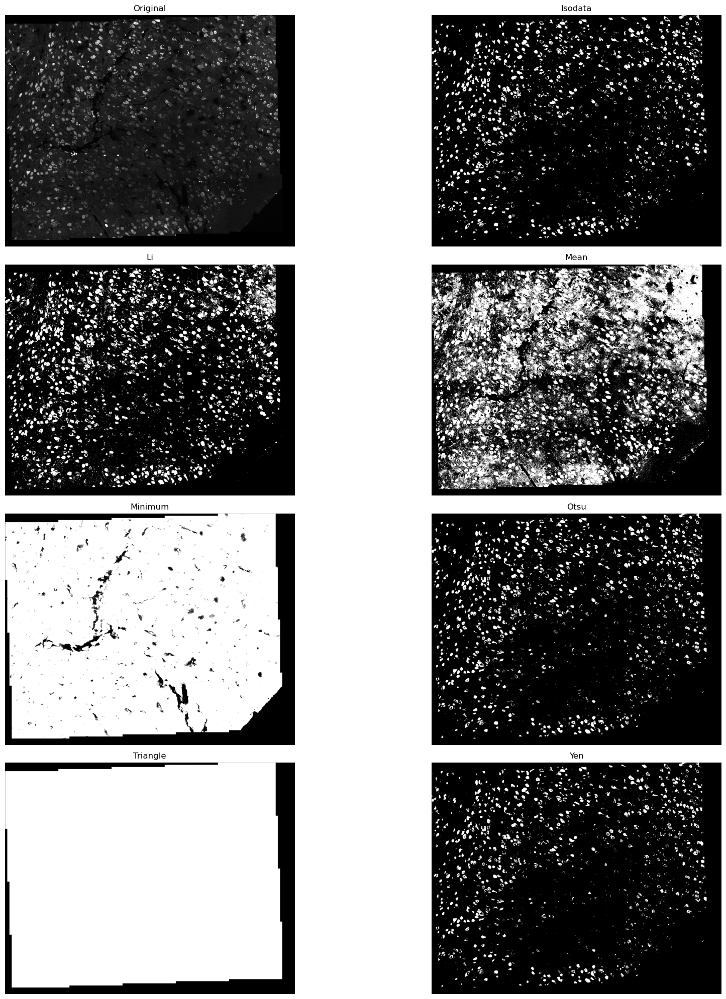

In [10]:
fig0, ax0=try_all_threshold(C0[0,:,:],figsize=(20,20),verbose=False)
plt.show()

<h3>Visualizing  masks for the smoothed green channel</h3>

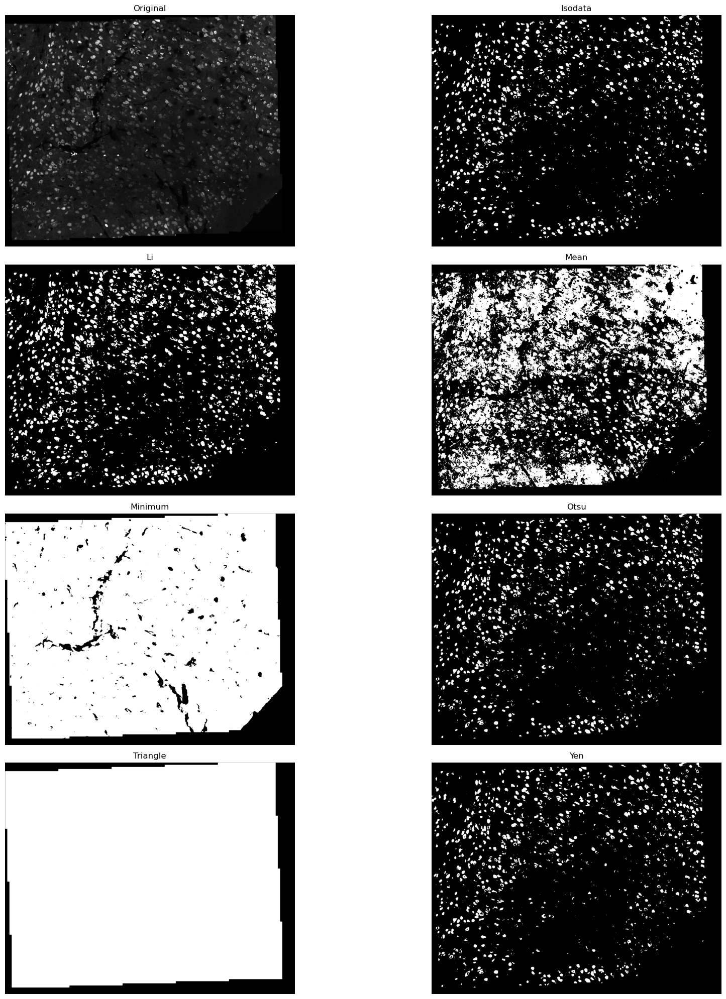

In [11]:
C0m= median(C0[0,:,:],disk(3), mode='constant',cval=0.0)
fig0m, ax0m=try_all_threshold(C0m,figsize=(20,20),verbose=False)
plt.show()

<h3>Visualizing masks for the blue channel without smoothing</h3>

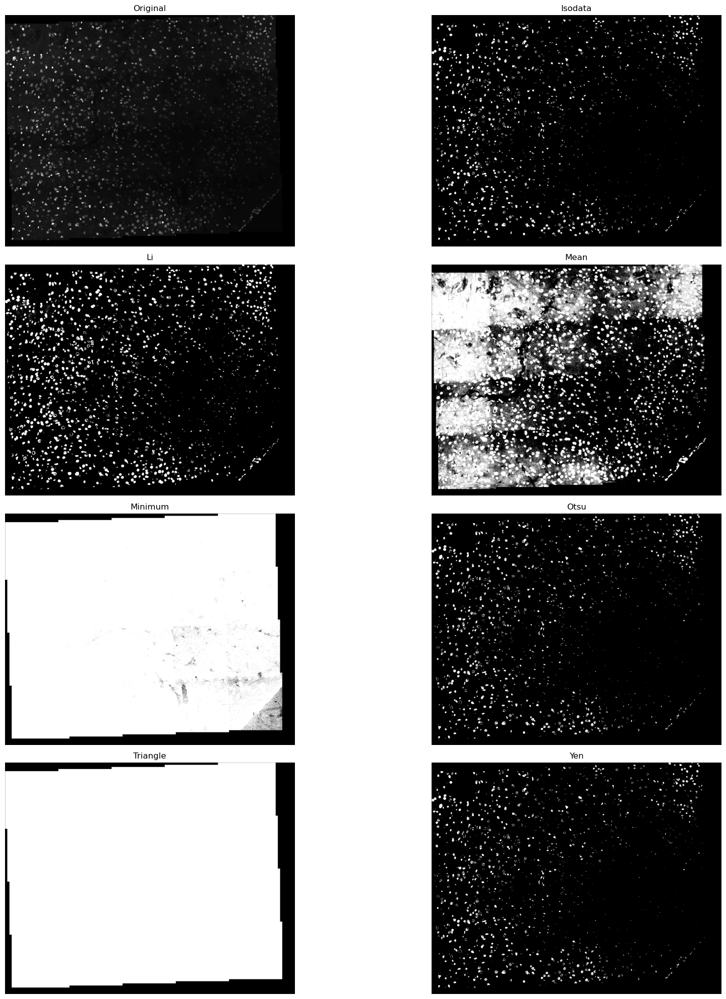

In [12]:
fig1, ax1=try_all_threshold(C1[0,:,:],figsize=(20,20),verbose=False)
plt.show()

<h3>Visualizing masks for the smoothed blue channel</h3>

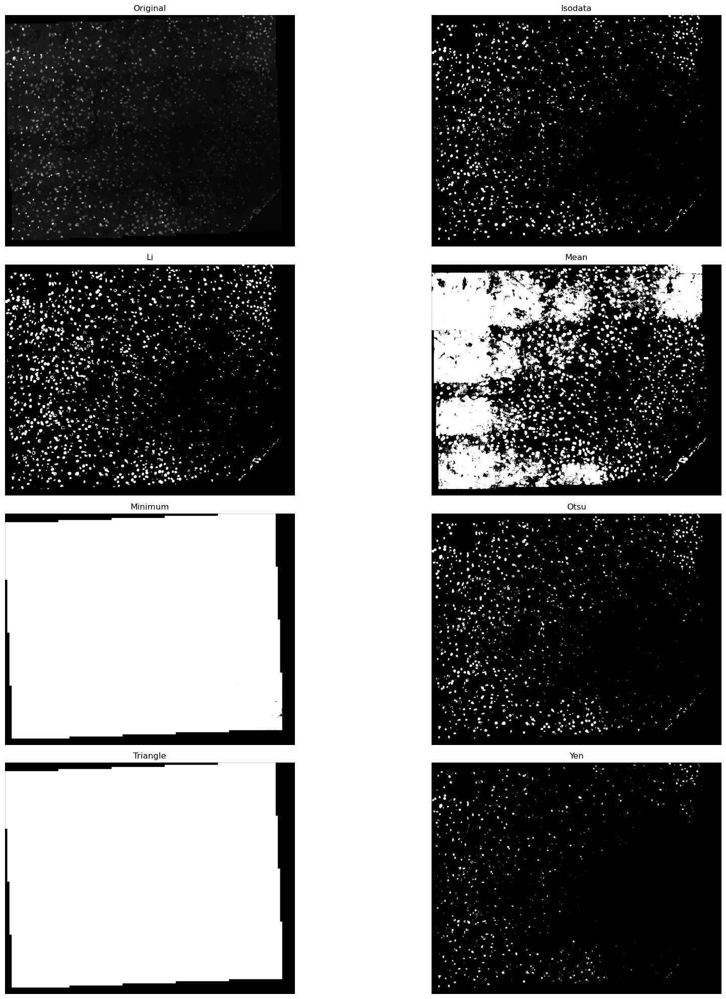

In [13]:
C1m= median(C1[0,:,:],disk(3), mode='constant',cval=0.0)
fig1m, ax1m=try_all_threshold(C1m,figsize=(20,20),verbose=False)
plt.show()

<h3>Visualizing masks for the red channel without smoothing</h3>

/home/jair/anaconda3/envs/envj/lib/python3.11/site-packages/skimage/filters/thresholding.py:757: RuntimeWarning: divide by zero encountered in log
  / (np.log(mean_back) - np.log(mean_fore)))


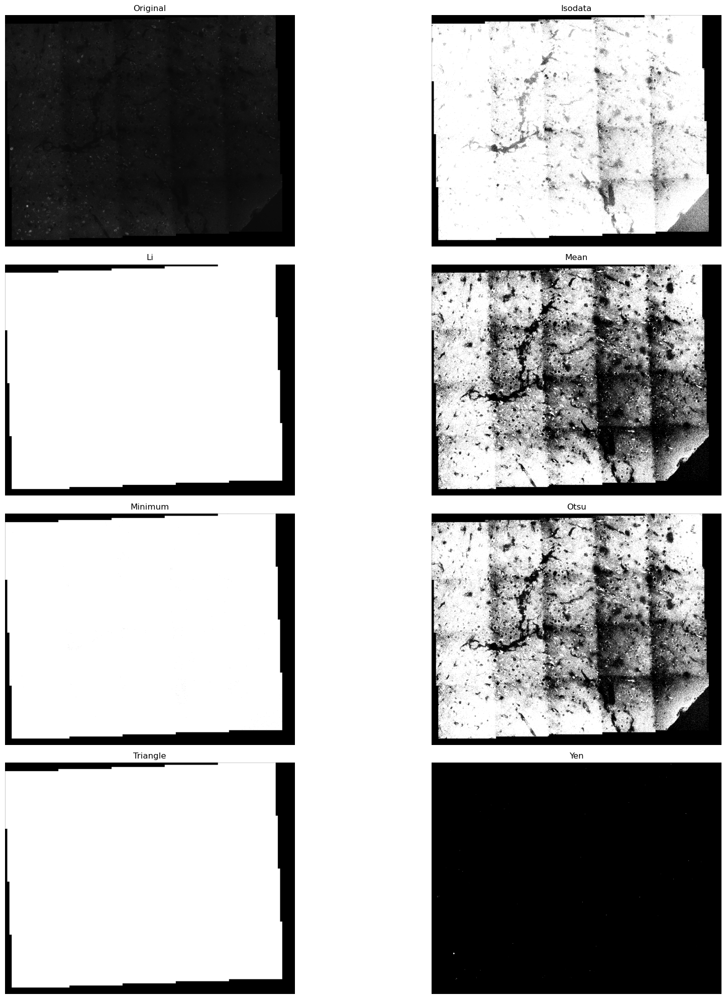

In [14]:
fig2, ax2=try_all_threshold(C2[0,:,:],figsize=(20,20),verbose=False)
plt.show()

<h3>Visualizing masks for the smoothed red channel</h3>

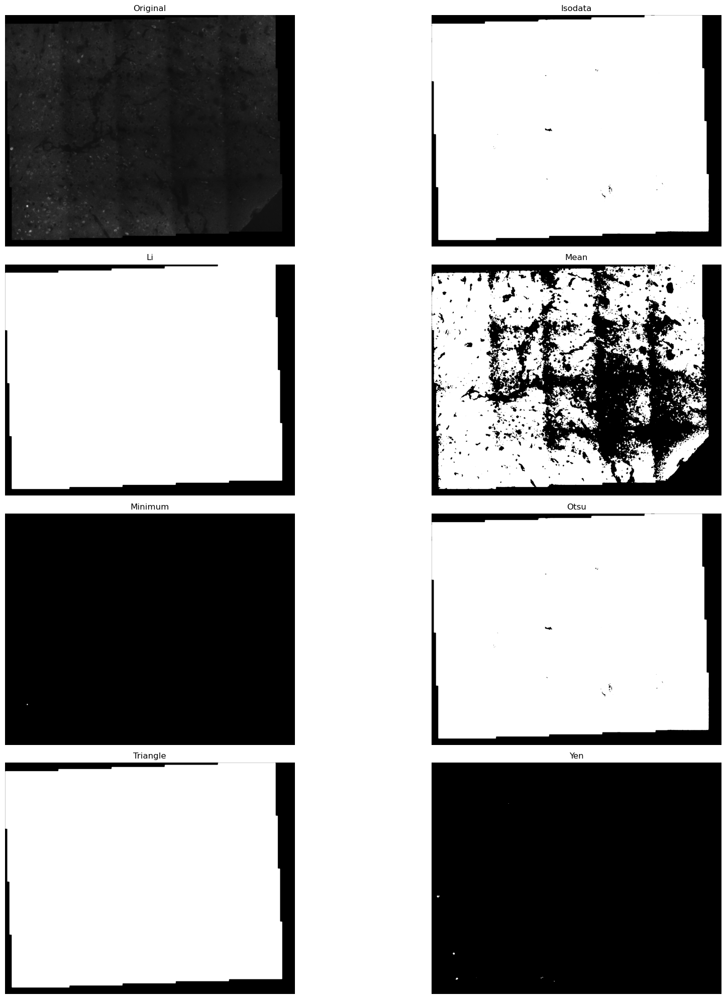

In [15]:
C2m= median(C2[0,:,:],disk(5), mode='constant',cval=0.0)
fig2m, ax2m=try_all_threshold(C2m,figsize=(20,20),verbose=False)
plt.show()

<h3>Defining whether we want to use the masks generated with the smoothed image or the unsmoothed one, and which threshold to use for the green channel.</h3>

In [16]:
suavizado_verde='si' #Here you choose if you want smoothing for the green channel options: si / no
tr_verde='otsu' #Here you choose the type of mask options: otsu/yen/triangle/minimum/li/mean/isodata 
C0masks=[]
for i in tqdm(range(nstack)):
        if suavizado_verde == 'si':
            C0im= median(C0[i,:,:],disk(3), mode='constant',cval=0.0)
        else:
            C0im=C0[i,:,:]
        if tr_verde == 'otsu':    
            C0ithr=threshold_otsu(C0im)
        elif tr_verde == 'yen':
            C0ithr=threshold_yen(C0im)
        elif tr_verde == 'triangle':
            C0ithr=threshold_triangle(C0im)
        elif tr_verde == 'minimum':
            C0ithr=threshold_minimum(C0im)
        elif tr_verde == 'li':
            C0ithr=threshold_li(C0im)
        elif tr_verde == 'mean':
            C0ithr=threshold_mean(C0im)
        elif tr_verde == 'isodata':
            C0ithr=threshold_isodata(C0im)
        else:
            print("el tipo de mascara que elegiste es incorrecto, seleccionaste: {} por favor revisalo".format(tr_verde))
            print("debe ser uno de los siguientes: otsu,yen,triangle,minimum,li,mean,isodata ")
            break            
        COibinary=C0im<=C0ithr
        C0masks.append(COibinary)

stack_C0masks = np.stack(C0masks)
io.imsave(root+"C0masks.tif",img_as_ubyte(stack_C0masks))
print("Generaste el stack de mascaras para canal verde  con el filtro: {} y {} suavizado".format(tr_verde,suavizado_verde))

100%|███████████████████████████████████████████| 16/16 [00:35<00:00,  2.21s/it]


Generaste el stack de mascaras para canal verde  con el filtro: otsu y si suavizado


<h3>Defining whether we want to use masks generated with the smoothed or unsmoothed image, and which threshold to use for the blue channel.</h3>

In [17]:
suavizado_azul='si' #Here you choose if you want smoothing for the blue channel options: si / no
tr_azul='otsu' #Here you choose the type of mask options: otsu/yen/triangle/minimum/li/mean/isodata 
C1masks=[]
for i in tqdm(range(nstack)):
        if suavizado_azul == 'si':
            C1im= median(C1[i,:,:],disk(3), mode='constant',cval=0.0)
        else:
            C1im=C1[i,:,:]
        if tr_azul == 'otsu':    
            C1ithr=threshold_otsu(C1im)
        elif tr_azul == 'yen':
            C1ithr=threshold_yen(C1im)
        elif tr_azul == 'triangle':
            C1ithr=threshold_triangle(C1im)
        elif tr_azul == 'minimum':
            C1ithr=threshold_minimum(C1im)
        elif tr_azul == 'li':
            C1ithr=threshold_li(C1im)
        elif tr_azul == 'mean':
            C1ithr=threshold_mean(C1im)
        elif tr_azul == 'isodata':
            C1ithr=threshold_isodata(C1im)
        else:
            print("el tipo de mascara que elegiste es incorrecto, seleccionaste: {} por favor revisalo".format(tr_azul))
            print("debe ser uno de los siguientes: otsu,yen,triangle,minimum,li,mean,isodata ")
            break 
        C1ibinary=C1im<=C1ithr
        C1masks.append(C1ibinary)

stack_C1masks = np.stack(C1masks)
io.imsave(root+"C1masks.tif",img_as_ubyte(stack_C1masks))
print("Generaste el stack de mascaras para canal azul  con el filtro: {} y {} suavizado".format(tr_azul,suavizado_azul))

100%|███████████████████████████████████████████| 16/16 [00:35<00:00,  2.24s/it]


Generaste el stack de mascaras para canal azul  con el filtro: otsu y si suavizado


<h3>Defining whether we want to use masks generated with the smoothed or unsmoothed image, and which threshold to use for the red channel.</h3>

In [18]:
suavizado_rojo='si' #Here you choose if you want smoothing for the red channel options: si / no
tr_rojo='yen' #Here you choose the type of mask options: otsu/yen/triangle/minimum/li/mean/isodata 
C2masks=[]
for i in tqdm(range(nstack)):
        if suavizado_rojo == 'si':
            C2im= median(C2[i,:,:],disk(3), mode='constant',cval=0.0)
        else:
            C2im=C2[i,:,:]
        if tr_rojo == 'otsu':    
            C2ithr=threshold_otsu(C2im)
        elif tr_rojo == 'yen':
            C2ithr=threshold_yen(C2im)
        elif tr_rojo == 'triangle':
            C2ithr=threshold_triangle(C2im)
        elif tr_rojo == 'minimum':
            C2ithr=threshold_minimum(C2im)
        elif tr_rojo == 'li':
            C2ithr=threshold_li(C2im)
        elif tr_rojo == 'mean':
            C2ithr=threshold_mean(C2im)
        elif tr_rojo == 'isodata':
            C2ithr=threshold_isodata(C2im)
        else:
            print("el tipo de mascara que elegiste es incorrecto, seleccionaste: {} por favor revisalo".format(tr_rojo))
            print("debe ser uno de los siguientes: otsu,yen,triangle,minimum,li,mean,isodata ")
            break 
        C2ibinary=C2im<=C2ithr
        C2masks.append(C2ibinary)

stack_C2masks = np.stack(C2masks)
io.imsave(root+"C2masks.tif",img_as_ubyte(stack_C2masks))
print("Generaste el stack de mascaras para canal azul  con el filtro: {} y {} suavizado".format(tr_rojo,suavizado_rojo))

100%|███████████████████████████████████████████| 16/16 [00:35<00:00,  2.25s/it]


Generaste el stack de mascaras para canal azul  con el filtro: yen y si suavizado


/tmp/ipykernel_534399/1216245698.py:31: UserWarning: /home/jair/Downloads/merge_1/C2masks.tif is a low contrast image
  io.imsave(root+"C2masks.tif",img_as_ubyte(stack_C2masks))


<h3>Let's visualize the generated masks</h3>

In [19]:
C0M = io.imread(root+'C0masks.tif')
C1M = io.imread(root+'C1masks.tif')
C2M = io.imread(root+'C2masks.tif')
C0M=img_as_ubyte(C0M)
C1M=img_as_ubyte(C1M)
C2M=img_as_ubyte(C2M)

<h3>Generated masks for the green channel</h3>

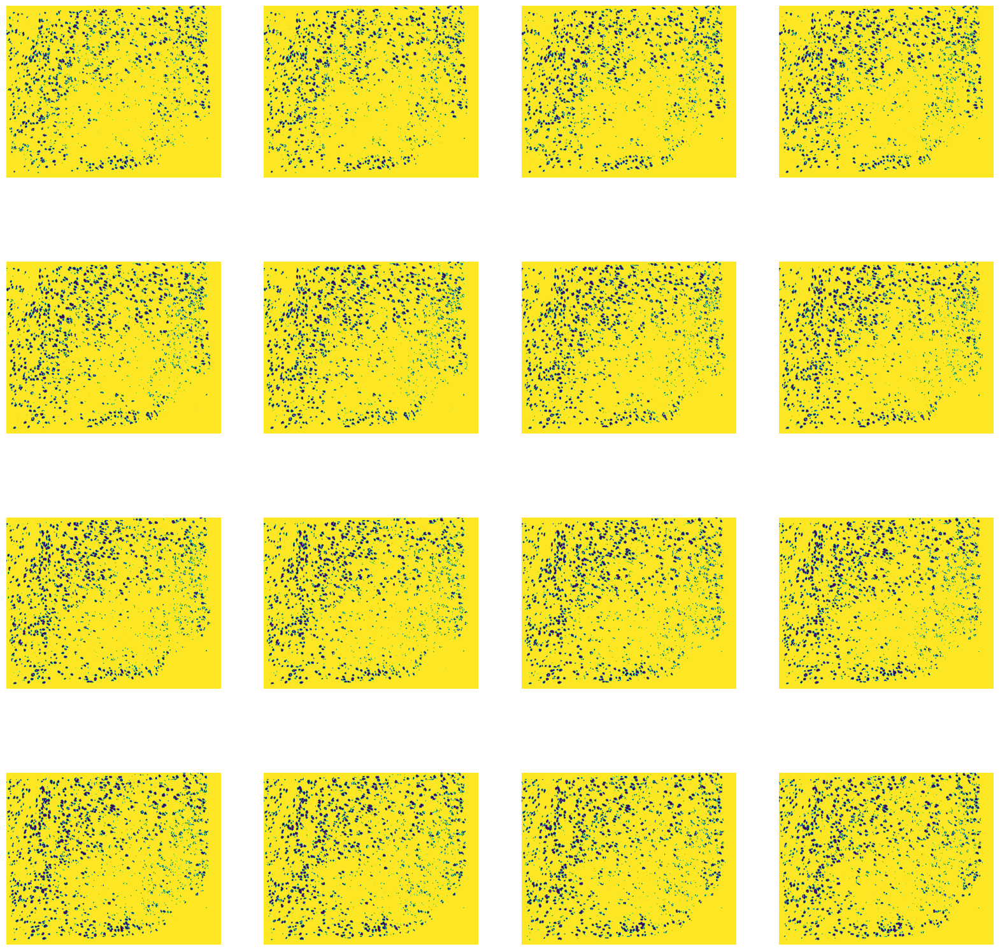

In [20]:
dibuja_mascaras(C0M,nstack)

<h3>Generated masks for the blue channel</h3>

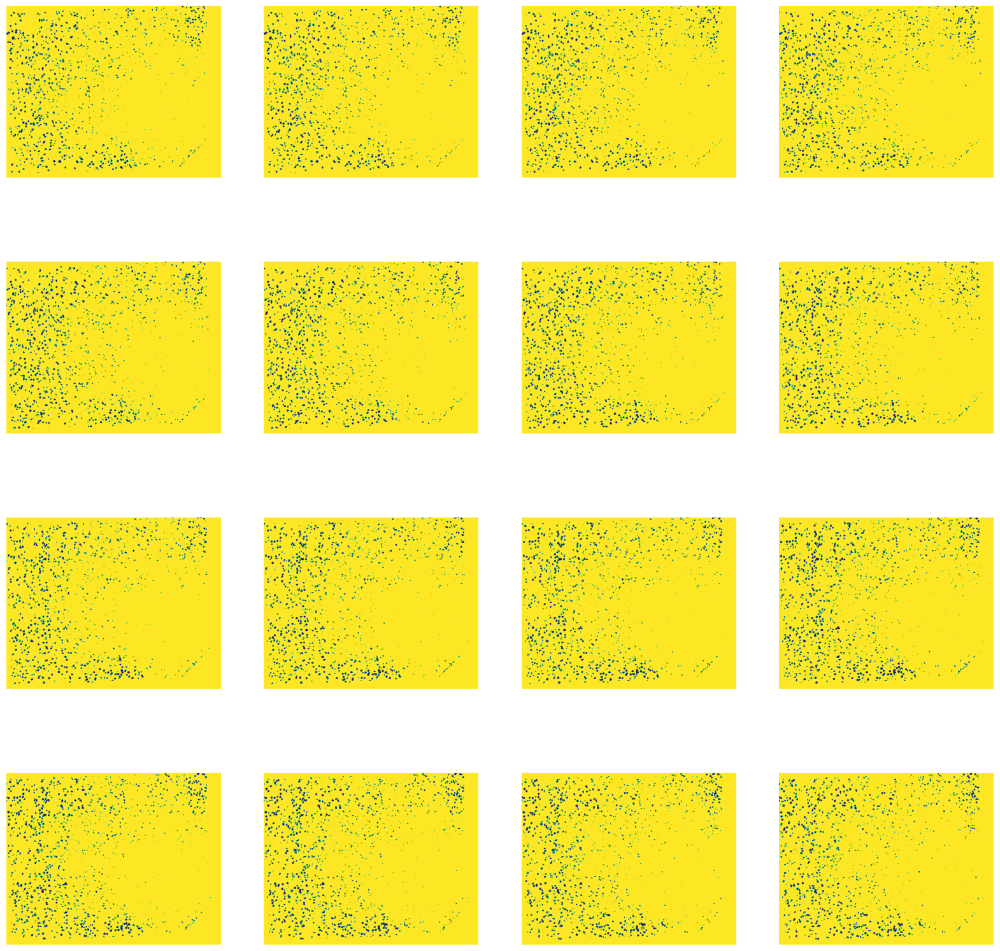

In [21]:
dibuja_mascaras(C1M,nstack)

<h3>Generated masks for the red channel</h3>

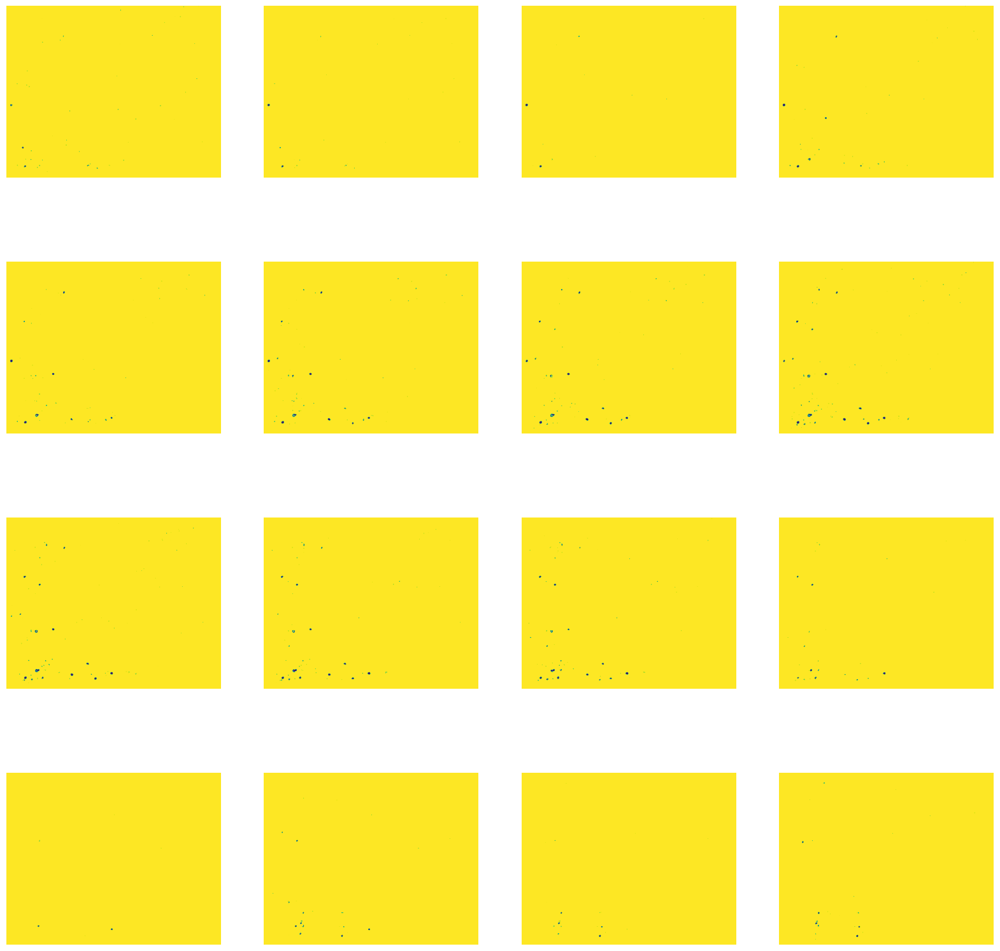

In [22]:
dibuja_mascaras(C2M,nstack)

<h3>Let's try to improve masks through processing that removes extremely small points and fills disconnected points.</h3>

<h3>Processing masks for the green channel</h3>

In [23]:
C0masks=[]
for i in tqdm(range(nstack)):
    img=C0M[i,:,:]
    imgM=median(img, disk(7),mode='constant',cval=0)
    imgM2=median(imgM, disk(7),mode='constant',cval=0)
    C0masks.append(imgM2)
stack = np.stack(C0masks)
io.imsave(root+"C0maskproce.tif",img_as_ubyte(stack))
print("Generaste mascaras procedadas para el canal verde: ",root+"C0maskproce.tif")

100%|███████████████████████████████████████████| 16/16 [01:15<00:00,  4.72s/it]


Generaste mascaras procedadas para el canal verde:  /home/jair/Downloads/merge_1/C0maskproce.tif


<h3>Processing masks for the blue channel</h3>

In [24]:
C0masks=[]
for i in tqdm(range(nstack)):
    img=C1M[i,:,:]
    imgM=median(img, disk(2),mode='constant',cval=0)
    imgM2=median(imgM, disk(2),mode='constant',cval=0)
    imgM=median(imgM2, disk(2),mode='constant',cval=0)
    imgM2=median(imgM, disk(3),mode='constant',cval=0)
    imgM=median(imgM2, disk(3),mode='constant',cval=0)
    C0masks.append(imgM)
stack = np.stack(C0masks)
io.imsave(root+"C1maskproce.tif",img_as_ubyte(stack))
print("Generaste mascaras procedadas para el canal azul: ",root+"C1maskproce.tif")

100%|███████████████████████████████████████████| 16/16 [00:25<00:00,  1.62s/it]


Generaste mascaras procedadas para el canal azul:  /home/jair/Downloads/merge_1/C1maskproce.tif


<h3>Processing masks for the red channel</h3>

In [25]:
C0masks=[]
for i in tqdm(range(nstack)):
    img=C2M[i,:,:]
    imgM=median(img, disk(2),mode='constant',cval=0)
    imgM2=median(imgM, disk(2),mode='constant',cval=0)
    imgM=median(imgM2, disk(2),mode='constant',cval=0)
    imgM2=median(imgM, disk(2),mode='constant',cval=0)
    imgM=median(imgM2, disk(2),mode='constant',cval=0)
    imgM2=median(imgM, disk(2),mode='constant',cval=0)
    imgM=median(imgM2, disk(3),mode='constant',cval=0)
    imgM2=median(imgM, disk(3),mode='constant',cval=0)
    imgM=median(imgM2, disk(3),mode='constant',cval=0)
    imgM2=median(imgM, disk(3),mode='constant',cval=0)
    C0masks.append(imgM2)
stack = np.stack(C0masks)
io.imsave(root+"C2maskproce.tif",img_as_ubyte(stack))
print("Generaste mascaras procedadas para el canal rojo: ",root+"C2maskproce.tif")

100%|███████████████████████████████████████████| 16/16 [00:48<00:00,  3.02s/it]


Generaste mascaras procedadas para el canal rojo:  /home/jair/Downloads/merge_1/C2maskproce.tif


/tmp/ipykernel_534399/1865625270.py:16: UserWarning: /home/jair/Downloads/merge_1/C2maskproce.tif is a low contrast image
  io.imsave(root+"C2maskproce.tif",img_as_ubyte(stack))


<h3>Since we are interested in the green signal (neurons) + blue (nuclei) + red (c-fos) = neurons expressing c-fos, let's take the maximum information in masks.</h3>

In [26]:
C0MP = io.imread(root+'C0maskproce.tif')
C1MP = io.imread(root+'C1maskproce.tif')
C2MP = io.imread(root+'C2maskproce.tif')
C0MP=img_as_bool(C0MP)
C1MP=img_as_bool(C1MP)
C2MP=img_as_bool(C2MP)

In [30]:
C0mask=[]
for i in tqdm(range(nstack)):
    M0=C0MP[i,...]
    M1=C1MP[i,...]
    M2=C2MP[i,...]
    inter1 = np.logical_or(M0,M1)
    inter2= np.logical_or(inter1,M2)
    inter=img_as_ubyte(inter2)
    C0mask.append(inter)
stack = np.stack(C0mask)
io.imsave(root+"CmaskT.tif",img_as_ubyte(stack))
print("Generaste mascaras con la información en comun en cada canal : ",root+"CmaskT.tif")

100%|██████████████████████████████████████████| 16/16 [00:00<00:00, 206.91it/s]


Generaste mascaras con la información en comun en cada canal :  /home/jair/Downloads/merge_1/CmaskT.tif


/tmp/ipykernel_534399/3491296333.py:11: UserWarning: /home/jair/Downloads/merge_1/CmaskT.tif is a low contrast image
  io.imsave(root+"CmaskT.tif",img_as_ubyte(stack))


<h3>So we have 3 possible masks: two that only consider the red channel (one processed and one unprocessed) and one that contains the intersection of all three channels.</h3>

In [31]:
CT=io.imread(root+'CmaskT.tif')
CR=io.imread(root+'C2masks.tif')
CRP=io.imread(root+'C2maskproce.tif')
CT=img_as_ubyte(CT)
CR=img_as_ubyte(CR)
CRP=img_as_ubyte(CRP)

<h3>Masks containing the information common to all three channels</h3>

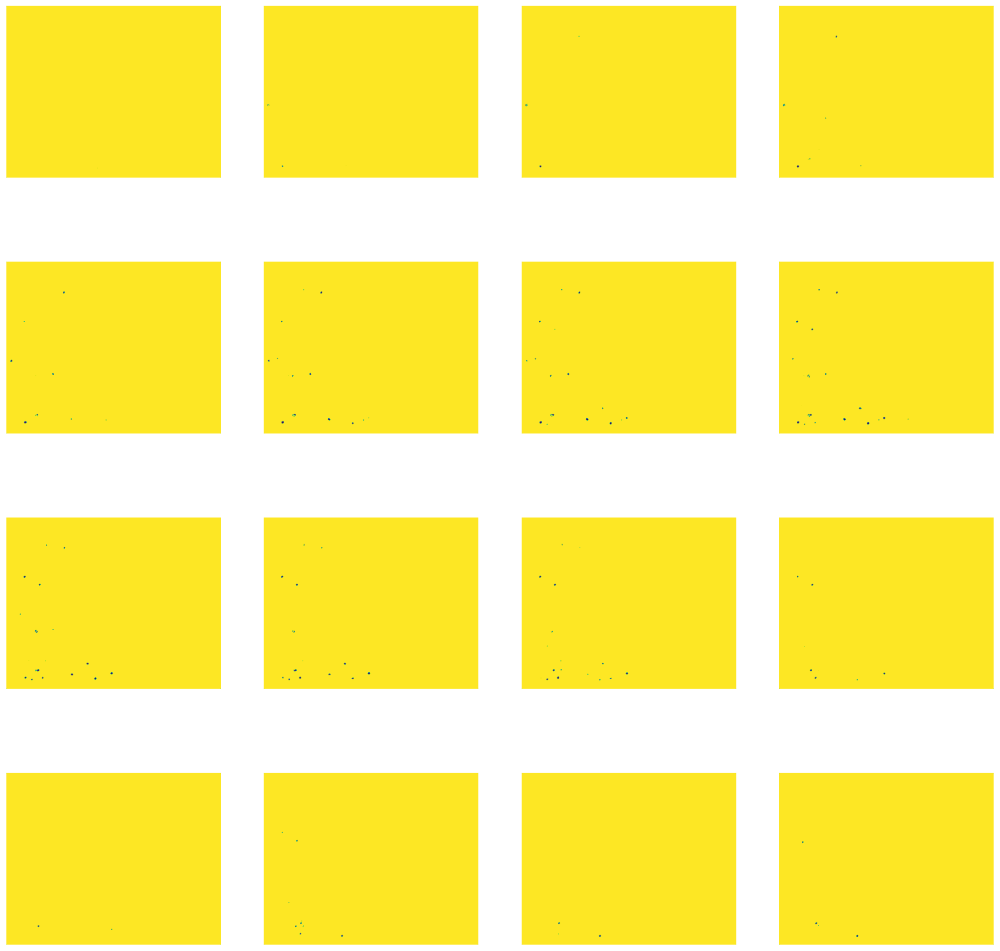

In [32]:
dibuja_mascaras(CT,nstack)

<h3>Masks containing information only from the red channel</h3>

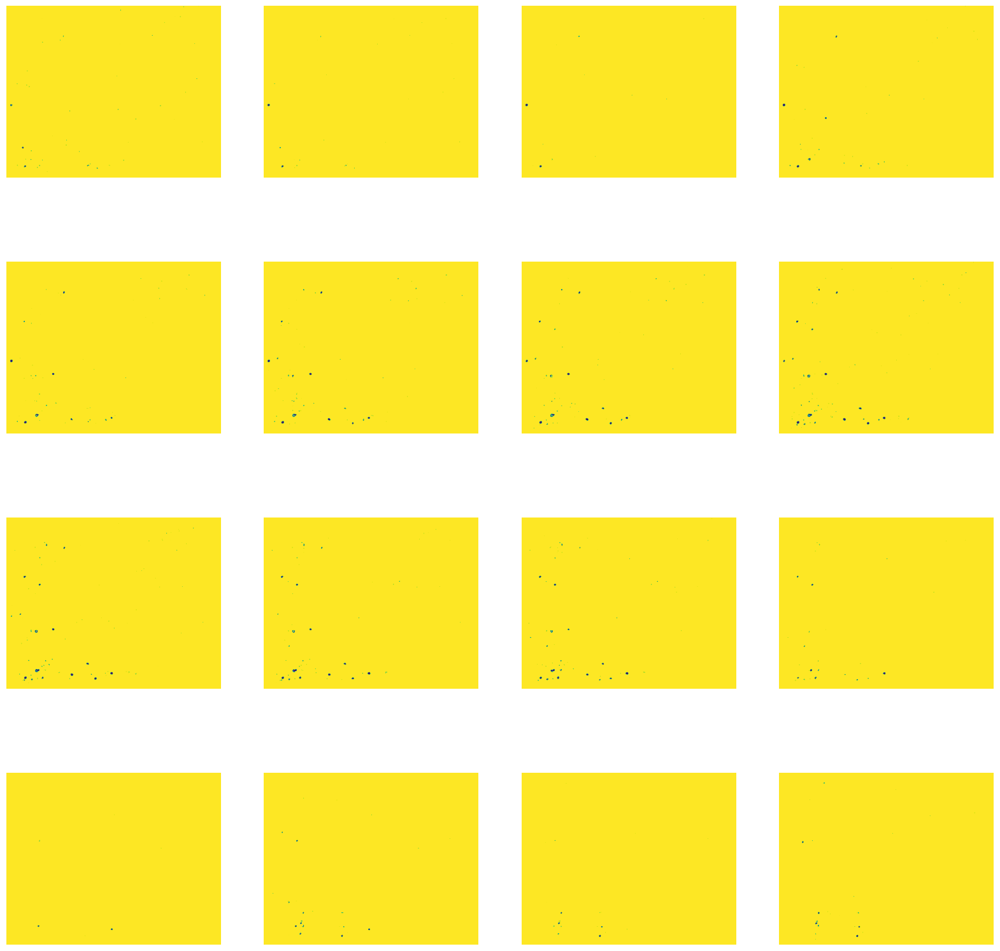

In [33]:
dibuja_mascaras(CR,nstack)

<h3>Masks containing information only from the red channel but processed</h3>

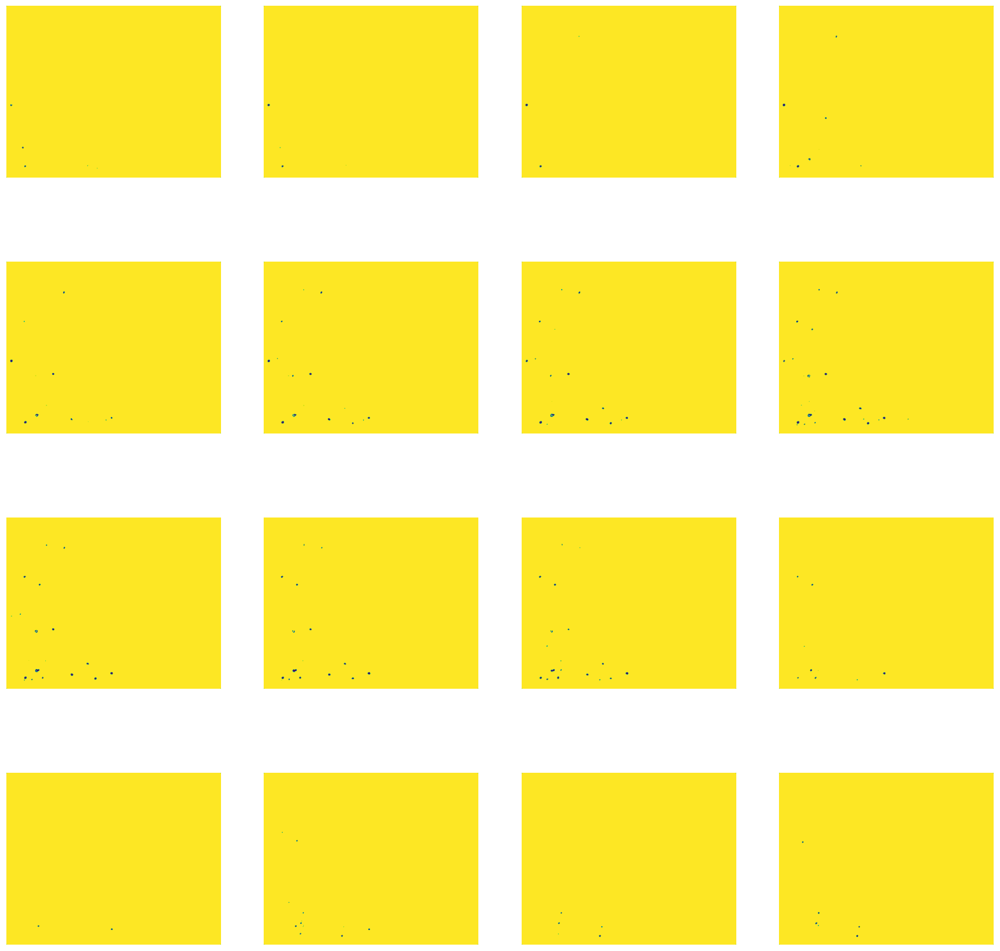

In [34]:
dibuja_mascaras(CRP,nstack)

<h3>Let's generate a single mask with the maximum information content from each individual mask for the common information of the three channels.</h3>

100%|██████████████████████████████████████████| 16/16 [00:00<00:00, 822.57it/s]
/tmp/ipykernel_534399/1028913455.py:5: UserWarning: /home/jair/Downloads/merge_1/CTU.tif is a low contrast image
  io.imsave(root+'CTU.tif',I)


Generaste mascara única con el contenido maximo de información en cada mascara individual para  la información comun los 3 canales:  /home/jair/Downloads/merge_1/CTU.tif


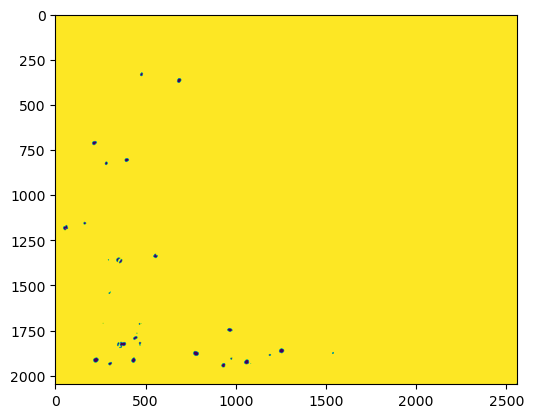

In [35]:
I=img_as_ubyte(np.ones(((xs,ys))))
for i in tqdm(range(nstack)):
    img=CT[i,...]
    I=I*img
io.imsave(root+'CTU.tif',I)  
plt.imshow(I)
print("Generaste mascara única con el contenido maximo de información en cada mascara individual para  la información comun los 3 canales: ",root+'CTU.tif')

<h3>Let's generate a single mask with the maximum information content from each individual mask for the red channel.</h3>

100%|██████████████████████████████████████████| 16/16 [00:00<00:00, 884.58it/s]
/tmp/ipykernel_534399/2156153558.py:5: UserWarning: /home/jair/Downloads/merge_1/CRU.tif is a low contrast image
  io.imsave(root+'CRU.tif',I)


Generaste mascara única con el contenido maximo de información en cada mascara individual para el canal rojo:  /home/jair/Downloads/merge_1/CRU.tif


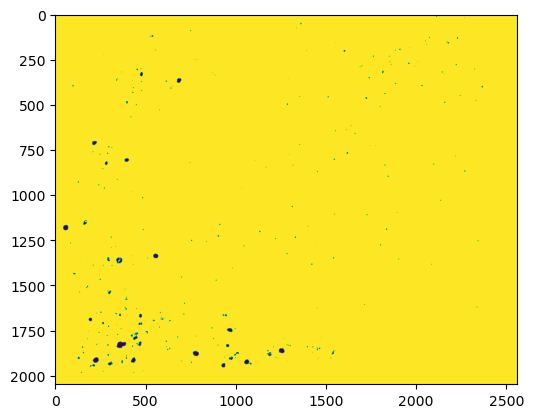

In [36]:
I=img_as_ubyte(np.ones(((xs,ys))))
for i in tqdm(range(nstack)):
    img=CR[i,...]
    I=I*img
io.imsave(root+'CRU.tif',I)  
plt.imshow(I)
print("Generaste mascara única con el contenido maximo de información en cada mascara individual para el canal rojo: ",root+'CRU.tif')

<h3>Let's generate a single mask with the maximum processed information content from each individual mask for the red channel.</h3>

100%|██████████████████████████████████████████| 16/16 [00:00<00:00, 647.58it/s]
/tmp/ipykernel_534399/2717044369.py:5: UserWarning: /home/jair/Downloads/merge_1/CRPU.tif is a low contrast image
  io.imsave(root+'CRPU.tif',I)


Generaste mascara única con el contenido comun de información en cada mascara individual procesada el canal rojo:  /home/jair/Downloads/merge_1/CRPU.tif


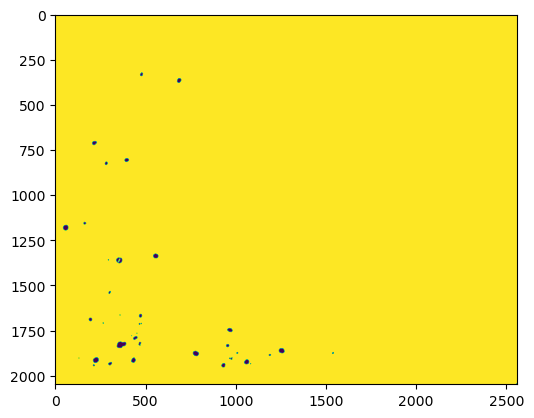

In [37]:
I=img_as_ubyte(np.ones(((xs,ys))))
for i in tqdm(range(nstack)):
    img=CRP[i,...]
    I=I*img
io.imsave(root+'CRPU.tif',I)  
plt.imshow(I)
print("Generaste mascara única con el contenido comun de información en cada mascara individual procesada el canal rojo: ",root+'CRPU.tif')

<h3>Let's visualize our original image</h3>

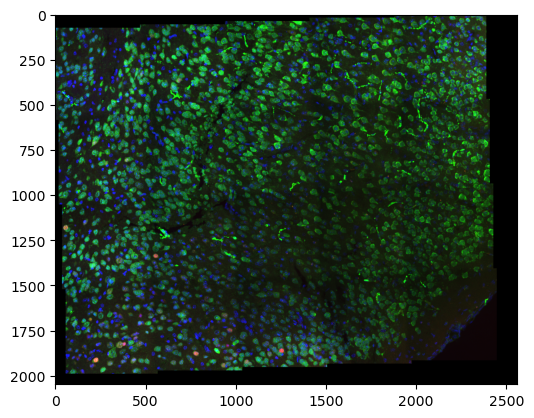

In [38]:
imagen = io.imread(root+'merge_1.png')

# Load binary mask
mascara = io.imread(root+'CTU.tif', as_gray=True)


mascara_bool = img_as_bool(mascara)


imagen_con_mascara = np.copy(imagen)


imagen_con_mascara[mascara_bool] = [0, 0, 0]  


plt.imshow(imagen)
plt.show()

<h3>Let's visualize the single mask with the common information from the 3 channels over our original image</h3>

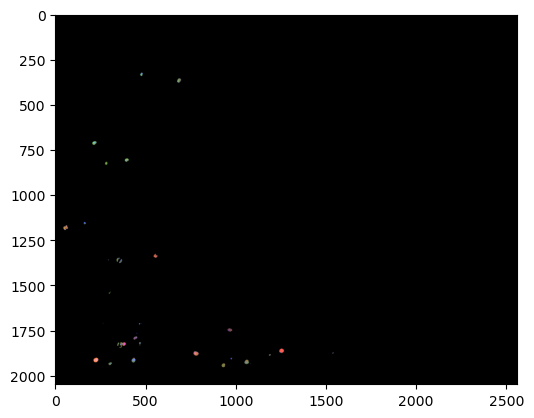

Guardaste mascara montada:  /home/jair/Downloads/merge_1/CTUmontada.tif


/tmp/ipykernel_534399/1816325362.py:3: UserWarning: /home/jair/Downloads/merge_1/CTUmontada.tif is a low contrast image
  io.imsave(root+'CTUmontada.tif',imagen_con_mascara)


In [39]:
plt.imshow(imagen_con_mascara)
plt.show()
io.imsave(root+'CTUmontada.tif',imagen_con_mascara)
print("Guardaste mascara montada: ", root+'CTUmontada.tif')

<h3>Let's visualize our original image</h3>

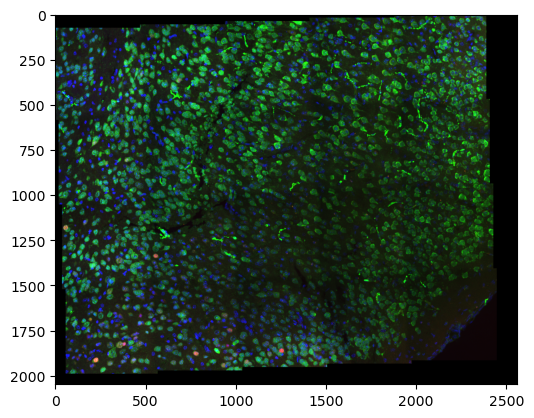

In [40]:
imagen = io.imread(root+'merge_1.png')

# Cargar la máscara binaria
mascara = io.imread(root+'CRU.tif', as_gray=True)

# Convertir la máscara a tipo de dato booleano
mascara_bool = img_as_bool(mascara)

# Crear una copia de la imagen original para superponer la máscara
imagen_con_mascara = np.copy(imagen)

# Asignar un color específico a los píxeles donde la máscara es True
imagen_con_mascara[mascara_bool] = [0, 0, 0]  # Rojo (puedes ajustar el color según tus preferencias)


plt.imshow(imagen)
plt.show()

<h3>Let's visualize the single mask with the information only from the red channel over our original image</h3>

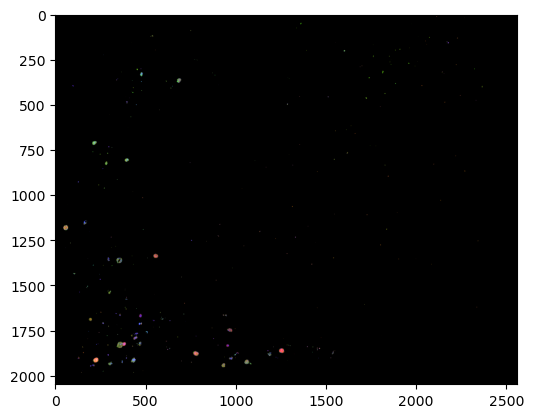

Guardaste mascara montada:  /home/jair/Downloads/merge_1/CRUmontada.tif


/tmp/ipykernel_534399/1757361071.py:3: UserWarning: /home/jair/Downloads/merge_1/CRUmontada.tif is a low contrast image
  io.imsave(root+'CRUmontada.tif',imagen_con_mascara)


In [41]:
plt.imshow(imagen_con_mascara)
plt.show()
io.imsave(root+'CRUmontada.tif',imagen_con_mascara)
print("Guardaste mascara montada: ", root+'CRUmontada.tif')

<h3>Let's visualize our original image</h3>

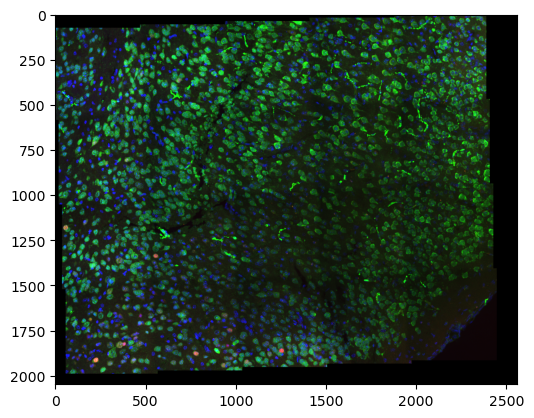

In [42]:
imagen = io.imread(root+'merge_1.png')

# Cargar la máscara binaria
mascara = io.imread(root+'CRPU.tif', as_gray=True)

# Convertir la máscara a tipo de dato booleano
mascara_bool = img_as_bool(mascara)

# Crear una copia de la imagen original para superponer la máscara
imagen_con_mascara = np.copy(imagen)

# Asignar un color específico a los píxeles donde la máscara es True
imagen_con_mascara[mascara_bool] = [0, 0, 0]  # Rojo (puedes ajustar el color según tus preferencias)


plt.imshow(imagen)
plt.show()

<h3>Let's visualize the single mask with the processed information only from the red channel over our original image</h3>

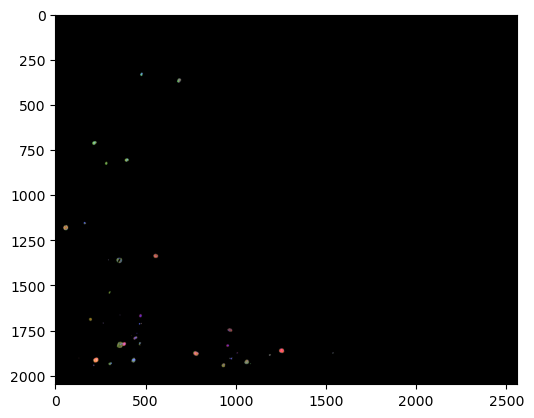

Guardaste mascara montada:  /home/jair/Downloads/merge_1/CRPUmontada.tif


/tmp/ipykernel_534399/95323858.py:3: UserWarning: /home/jair/Downloads/merge_1/CRPUmontada.tif is a low contrast image
  io.imsave(root+'CRPUmontada.tif',imagen_con_mascara)


In [43]:
plt.imshow(imagen_con_mascara)
plt.show()
io.imsave(root+'CRPUmontada.tif',imagen_con_mascara)
print("Guardaste mascara montada: ", root+'CRPUmontada.tif')